In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
import torchvision
import numpy as np
# Remove all the warnings
import warnings
warnings.filterwarnings('ignore')

# Set env CUDA_LAUNCH_BLOCKING=1
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [3]:
def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    # Randomly initialize A and B
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    # Train the model
    for i in range(1000):
        # Compute the loss
        diff_matrix = torch.mm(W, H) - A
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        
        # Zero the gradients
        optimizer.zero_grad()
        
        # Backpropagate
        loss.backward(retain_graph=True)
        
        # Update the parameters
        optimizer.step()
        
    return W, H, loss

In [4]:
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [5]:
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


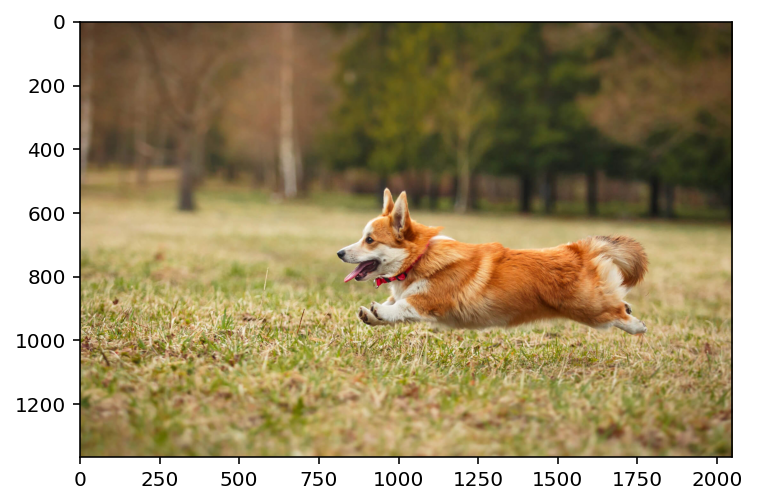

In [6]:
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

In [7]:
crop = torchvision.transforms.functional.crop(img, 600, 800, 300, 300)

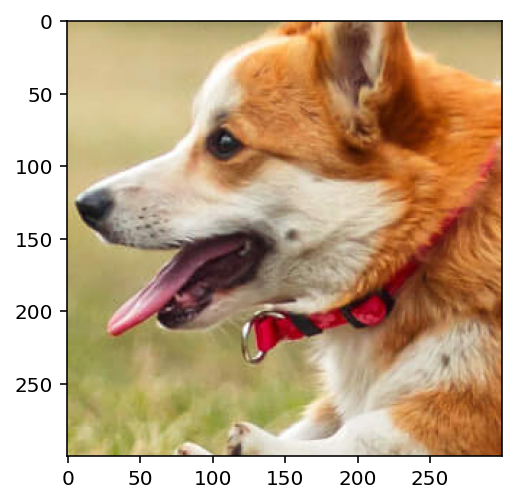

In [8]:
plt.imshow(rearrange(crop, 'c h w -> h w c').numpy())

To remove a rectangular patch of 30X30 and reconstrructing the image

In [9]:
def remove_rectangular_patch(image, top, left, height, width):
    # Clone the image to avoid modifying the original
    modified_image = image.clone()
    #modified_image = modified_image.float()
    
    # Set the specified rectangle to zeros
    modified_image[:, top:top+height, left:left+width] = 0
    
    return modified_image

In [10]:
# Mask a rectangular patch in the image
mask_top = 0
mask_left = 0
mask_height = 30
mask_width = 30

# Remove the rectangular patch from the image
modified_img1 = remove_rectangular_patch(crop, mask_top, mask_left, mask_height, mask_width)

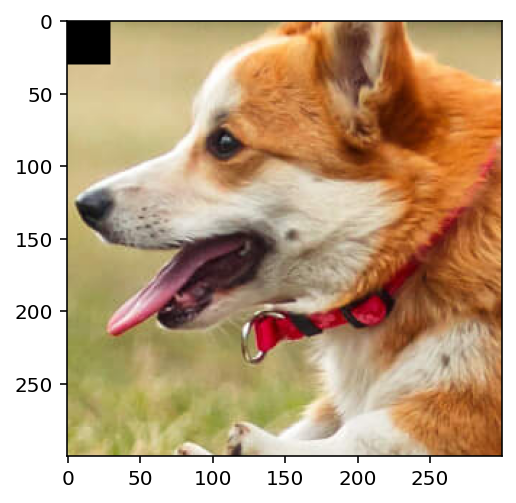

In [11]:
plt.imshow(rearrange(modified_img1, 'c h w -> h w c').numpy())

In [12]:
a1 = modified_img1[0]
a2 = modified_img1[1]
a3 = modified_img1[2]

In [13]:
def mask_image(img):
    img_copy = img.clone()
    mask = torch.rand(img.shape)==0
    img_copy[mask] = float('nan')
    return img_copy, mask

In [14]:
a1 = a1.float()
a1_mask = mask_image(a1)
a2 = a2.float()
a2_mask = mask_image(a2)
a3 = a3.float()
a3_mask = mask_image(a3)


In [15]:
def factorize_all(i1,i2,i3,k):
    W1, H1, loss1 = factorize(i1, k, device=device)
    W2, H2, loss2 = factorize(i2, k, device=device)
    W3, H3, loss3 = factorize(i3, k, device=device)
    combined_tensor1 = torch.stack([W1,W2,W3], dim=0)
    combined_tensor2 = torch.stack([H1,H2,H3],dim=0)
    reconstructed_img = (torch.matmul(combined_tensor1, combined_tensor2).cpu().detach().numpy())/2
    reconstructed_img = torch.tensor(reconstructed_img,dtype=float)
    return reconstructed_img

In [16]:
reconstructed_img = factorize_all(a1_mask[0],a2_mask[0],a3_mask[0],10)

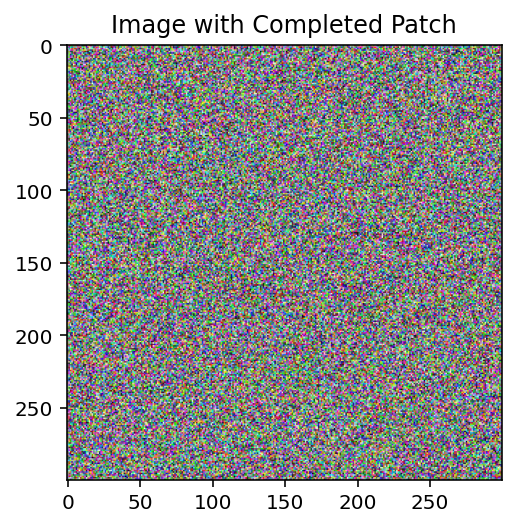

In [17]:
plt.imshow(F.to_pil_image(reconstructed_img))
plt.title("Image with Completed Patch")
plt.show()

Removing Random Pixels 

In [18]:
def remove_random_pixels(image_tensor, num_pixels_to_remove):
    
    _, height, width = image_tensor.shape

    img2 = image_tensor.clone()

    # Randomly select pixels to remove
    indices_to_remove = torch.randperm(height * width)[:num_pixels_to_remove]
    #print(indices_to_remove.shape)
    row_indices = indices_to_remove[:num_pixels_to_remove//2] // 300
    col_indices = indices_to_remove[num_pixels_to_remove//2:] % 300
    #print(row_indices.shape)
    #print(col_indices.shape)
    for i in row_indices:
        for j in col_indices:
            for channel in range(_):
                img2[channel,i,j] = 0

    '''  # Clone the image to avoid modifying the original
    modified_image = image.clone()
    
    # Set the specified rectangle to zeros
    modified_image[:, top:top+height, left:left+width] = 0'''

    return img2

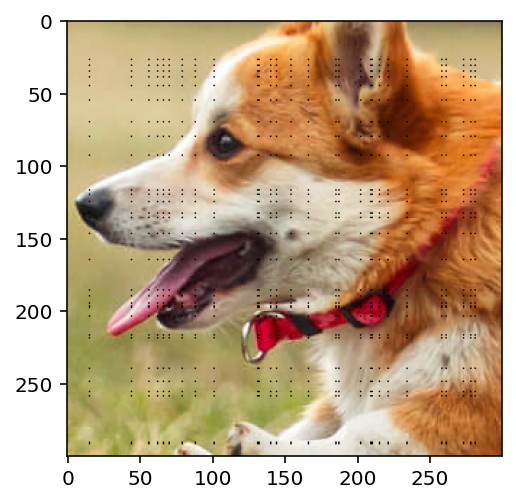

In [19]:
num_pixels_to_remove = 60
img1 = crop.int()
masked_img1 = remove_random_pixels(img1, num_pixels_to_remove)

plt.imshow(rearrange(masked_img1, 'c h w -> h w c').numpy())

In [20]:
b1 = masked_img1[0].float()
b1 = mask_image(b1)
b2 = masked_img1[1].float()
b2 = mask_image(b2)
b3 = masked_img1[2].float()
b3 = mask_image(b3)

In [21]:
recon_img = factorize_all(b1[0],b2[0],b3[0],10)

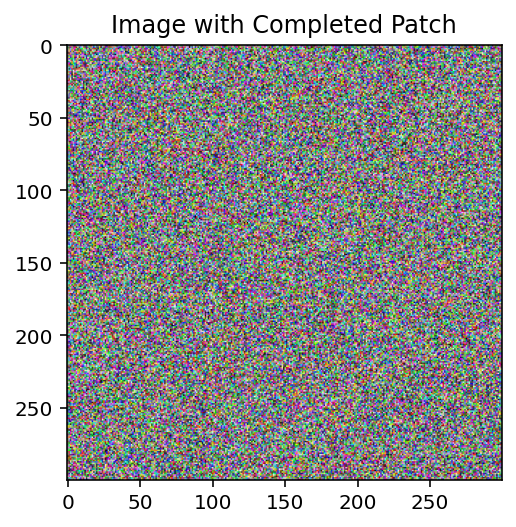

In [22]:
plt.imshow(F.to_pil_image(recon_img))
plt.title("Image with Completed Patch")
plt.show()

In [23]:
def calculate_rmse(original, reconstructed):
    mse = torch.nn.functional.mse_loss(original, reconstructed)
    rmse = torch.sqrt(mse)
    return rmse.item()

In [24]:
print("RMSE for the complete patch removal is ")
print(calculate_rmse(modified_img1,reconstructed_img))
print("RMSE for the random patch removal is")
print(calculate_rmse(masked_img1,recon_img))


RMSE for the complete patch removal is 
81.53857571443977
RMSE for the random patch removal is
82.49219649513154


In [52]:
print("PSNR for the complete patch removal is ")
print(calculate_rmse(modified_img1,reconstructed_img))
print("PNSR for the random patch removal is")
print(calculate_rmse(masked_img1,recon_img))

PSNR for the complete patch removal is 
78.50186589693844
PNSR for the random patch removal is
78.83211977905836


The image reconstruction is much better when a single patch has been removed instead of random pixels in the image, but not by much in both the cases the psnr and RMSE are very close to each other.  

Varying the patch size 

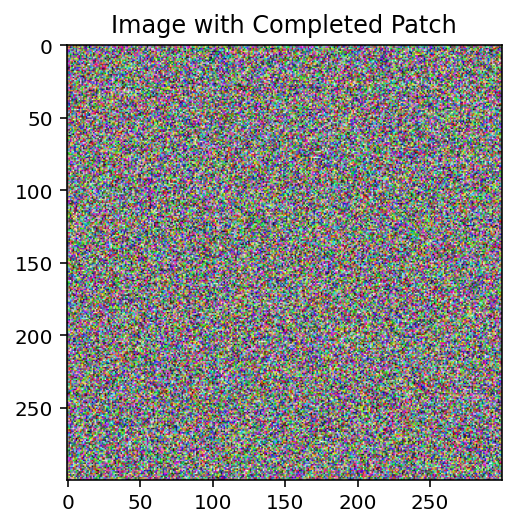

RMSE for the complete patch removal is 
82.12726803369796
PSNR for the complete patch removal is 
82.12726803369796


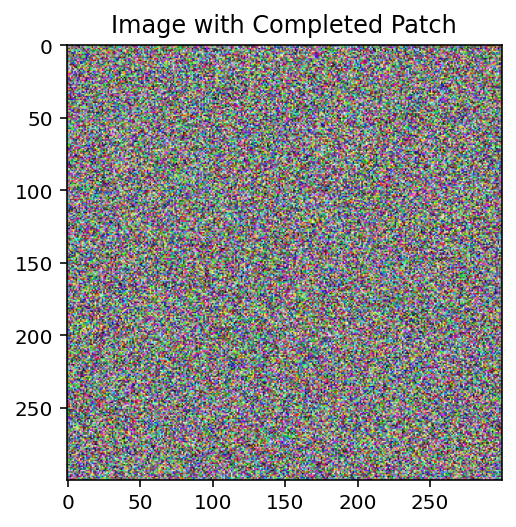

RMSE for the complete patch removal is 
81.00983448675254
PSNR for the complete patch removal is 
81.00983448675254


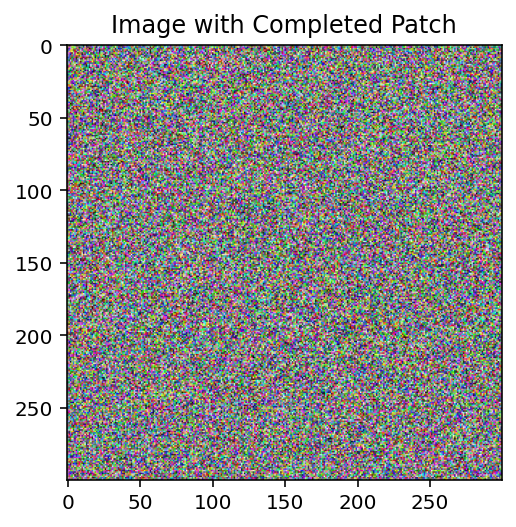

RMSE for the complete patch removal is 
79.63255998820776
PSNR for the complete patch removal is 
79.63255998820776


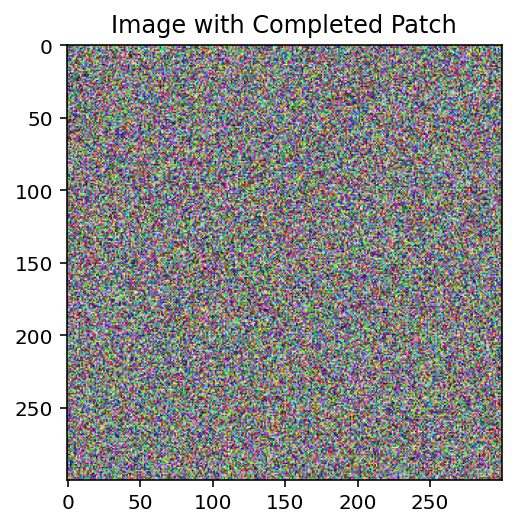

RMSE for the complete patch removal is 
77.72839451002935
PSNR for the complete patch removal is 
77.72839451002935


In [53]:
# varying the patch size 
size = [20,40,60,80]
for i in size:
    modified_img = remove_rectangular_patch(crop, 0, 0, i, i)
    plt.imshow(rearrange(modified_img, 'c h w -> h w c').numpy())
    a1 = modified_img[0].float()
    a2 = modified_img[1].float()
    a3 = modified_img[2].float()
    a1_mask = mask_image(a1)
    a2_mask = mask_image(a2)
    a3_mask = mask_image(a3)
    new_img = factorize_all(a1_mask[0],a2_mask[0],a3_mask[0],10)
    plt.imshow(F.to_pil_image(new_img))
    plt.title("Image with Completed Patch")
    plt.show()
    print("RMSE for the complete patch removal is ")
    print(calculate_rmse(modified_img,new_img))
    print("PSNR for the complete patch removal is ")
    print(calculate_rmse(modified_img,new_img))
    
    

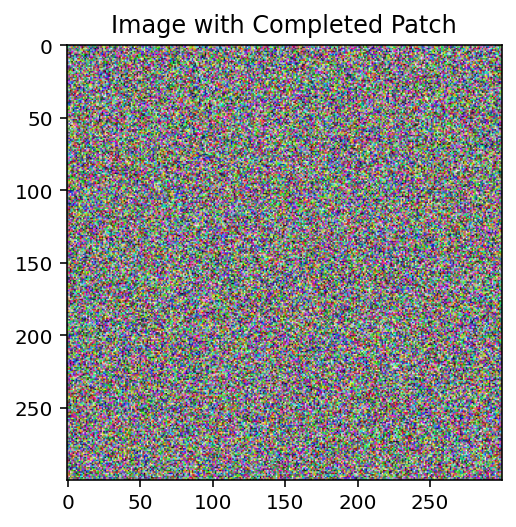

RMSE for the random patch removal is
82.09354972163926
PNSR for the random patch removal is
82.09354972163926


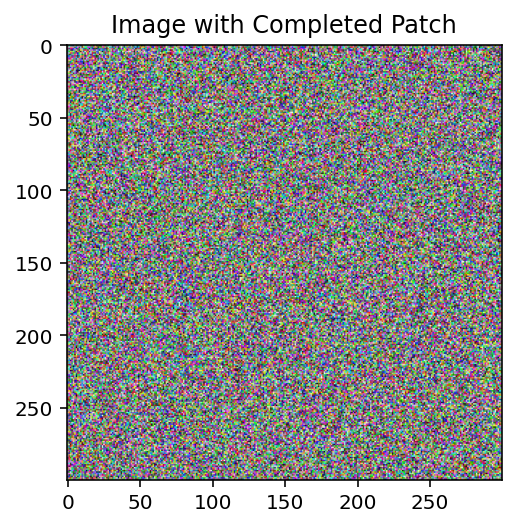

RMSE for the random patch removal is
82.19938162778037
PNSR for the random patch removal is
82.19938162778037


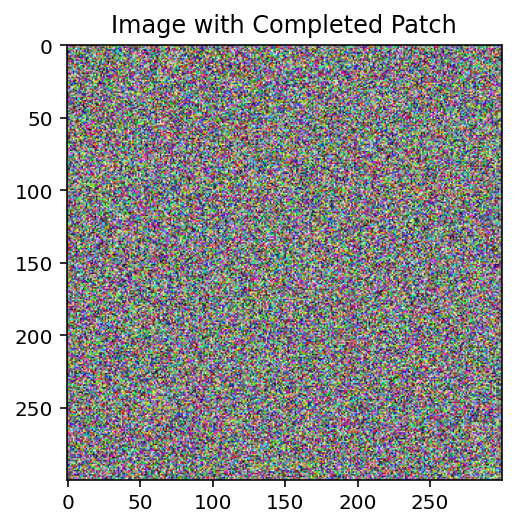

RMSE for the random patch removal is
81.40166528309008
PNSR for the random patch removal is
81.40166528309008


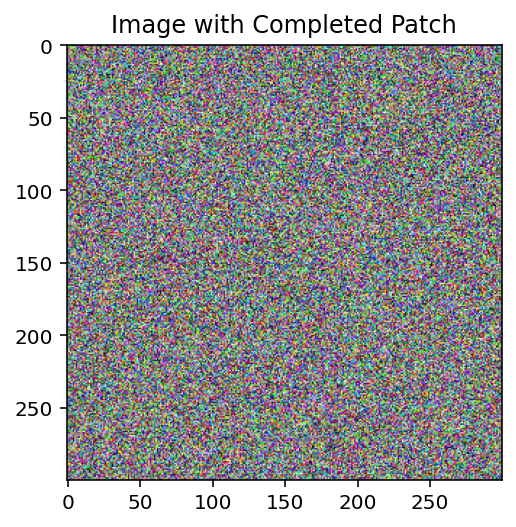

RMSE for the random patch removal is
80.74444102384952
PNSR for the random patch removal is
80.74444102384952


In [44]:
size = [20,40,60,80]
for i in size:
    modified_img = remove_random_pixels(crop, i*2)
    plt.imshow(rearrange(modified_img, 'c h w -> h w c').numpy())
    a1 = modified_img[0].float()
    a2 = modified_img[1].float()
    a3 = modified_img[2].float()
    a1_mask = mask_image(a1)
    a2_mask = mask_image(a2)
    a3_mask = mask_image(a3)
    new_img = factorize_all(a1_mask[0],a2_mask[0],a3_mask[0],10)
    plt.imshow(F.to_pil_image(new_img))
    plt.title("Image with Completed Patch")
    plt.show()
    print("RMSE for the random patch removal is")
    print(calculate_rmse(modified_img,new_img))
    print("PNSR for the random patch removal is")
    print(calculate_rmse(modified_img,new_img))
    
    
    

Increasing the patch size decreases the RMSE and PNSR values for the image 

Least Sqaures Method 

In [34]:
def matrix_factorization_als(R, k, max_iters=100, lambda_reg=0.01):
    """
    Perform matrix factorization using Alternating Least Squares (ALS).

    Parameters:
    - R: User-item matrix to be factorized
    - k: Number of latent features
    - max_iters: Maximum number of iterations
    - lambda_reg: Regularization parameter

    Returns:
    - P: User matrix
    - Q: Item matrix
    """
    R = np.array(R)
    num_users, num_items = R.shape

    # Initialize matrices P and Q with random values
    P = np.random.rand(num_users, k)
    Q = np.random.rand(k, num_items)

    for iteration in range(max_iters):
        # Update user matrix P
        for i in range(num_users):
            P[i, :] = np.linalg.solve(np.dot(Q, Q.T) + lambda_reg * np.eye(k), np.dot(Q, R[i, :].T))

        # Update item matrix Q
        for j in range(num_items):
            Q[:, j] = np.linalg.solve(np.dot(P.T, P) + lambda_reg * np.eye(k), np.dot(P.T, R[:, j]))

        # Calculate the error
        error = np.sum(np.square(R - np.dot(P, Q)))

        print(f"Iteration {iteration + 1}/{max_iters}, Error: {error}")

    return P, Q

In [37]:
def als_factor_all(img1,img2,img3,k):
    W1, H1 = matrix_factorization_als(img1, k)
    W2, H2 = matrix_factorization_als(img2, k)
    W3, H3 = matrix_factorization_als(img3, k)
    W1 = torch.tensor(W1)
    W2 = torch.tensor(W2)
    W3 = torch.tensor(W3)
    H1 = torch.tensor(H1)
    H2 = torch.tensor(H2)
    H3 = torch.tensor(H3)
    combined_tensor1 = torch.stack([W1,W2,W3], dim=0)
    combined_tensor2 = torch.stack([H1,H2,H3],dim=0)
    reconstructed_img = (torch.matmul(combined_tensor1, combined_tensor2).cpu().detach().numpy())/2
    reconstructed_img = torch.tensor(reconstructed_img,dtype=float)
    return reconstructed_img

Iteration 1/100, Error: 41736352.95493453
Iteration 2/100, Error: 25904109.783867266
Iteration 3/100, Error: 24959741.656643294
Iteration 4/100, Error: 24625827.249015186
Iteration 5/100, Error: 24189383.997437384
Iteration 6/100, Error: 23574409.026421525
Iteration 7/100, Error: 23109972.6825412
Iteration 8/100, Error: 22910378.603348948
Iteration 9/100, Error: 22843566.949990544
Iteration 10/100, Error: 22821803.940334495
Iteration 11/100, Error: 22814153.467468508
Iteration 12/100, Error: 22811129.959739666
Iteration 13/100, Error: 22809784.68498619
Iteration 14/100, Error: 22809126.130278565
Iteration 15/100, Error: 22808781.685045462
Iteration 16/100, Error: 22808593.72945025
Iteration 17/100, Error: 22808488.385455575
Iteration 18/100, Error: 22808428.297602445
Iteration 19/100, Error: 22808393.59568037
Iteration 20/100, Error: 22808373.36100428
Iteration 21/100, Error: 22808361.465877693
Iteration 22/100, Error: 22808354.421505906
Iteration 23/100, Error: 22808350.220392734
Iter

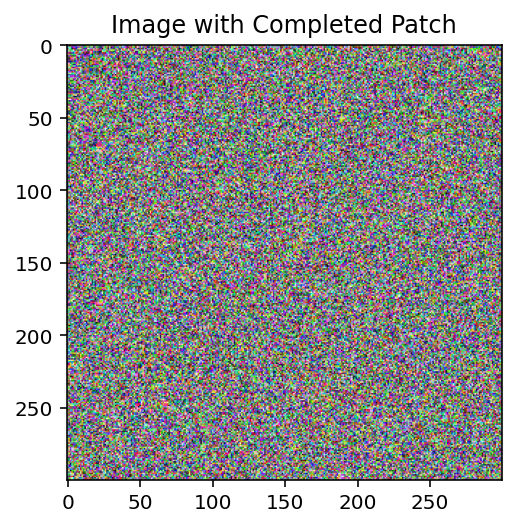

In [38]:
modified_img1 = remove_rectangular_patch(crop, mask_top, mask_left, mask_height, mask_width)
a1 = modified_img1[0]
a2 = modified_img1[1]
a3 = modified_img1[2]
a1 = a1.float()
a1_mask = mask_image(a1)
a2 = a2.float()
a2_mask = mask_image(a2)
a3 = a3.float()
a3_mask = mask_image(a3)
reconstructed_img = als_factor_all(a1_mask[0],a2_mask[0],a3_mask[0],10)
plt.imshow(F.to_pil_image(reconstructed_img))
plt.title("Image with Completed Patch")
plt.show()


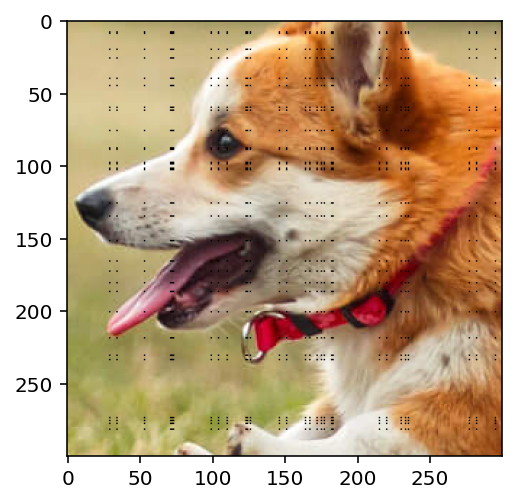

In [39]:
num_pixels_to_remove = 60
img1 = crop.int()
masked_img1 = remove_random_pixels(img1, num_pixels_to_remove)

plt.imshow(rearrange(masked_img1, 'c h w -> h w c').numpy())


In [40]:
b1 = masked_img1[0].float()
b1 = mask_image(b1)
b2 = masked_img1[1].float()
b2 = mask_image(b2)
b3 = masked_img1[2].float()
b3 = mask_image(b3)

Iteration 1/100, Error: 52850251.42493233
Iteration 2/100, Error: 29039988.883267697
Iteration 3/100, Error: 25749458.278115287
Iteration 4/100, Error: 25193197.690480046
Iteration 5/100, Error: 25039717.500344254
Iteration 6/100, Error: 24976753.37739961
Iteration 7/100, Error: 24947744.788707454
Iteration 8/100, Error: 24933932.10808538
Iteration 9/100, Error: 24927235.420187466
Iteration 10/100, Error: 24923934.20210607
Iteration 11/100, Error: 24922278.88244622
Iteration 12/100, Error: 24921434.597037893
Iteration 13/100, Error: 24920996.82145952
Iteration 14/100, Error: 24920766.294465963
Iteration 15/100, Error: 24920643.17726015
Iteration 16/100, Error: 24920576.59033728
Iteration 17/100, Error: 24920540.177155703
Iteration 18/100, Error: 24920520.073573787
Iteration 19/100, Error: 24920508.883687843
Iteration 20/100, Error: 24920502.612206258
Iteration 21/100, Error: 24920499.076864894
Iteration 22/100, Error: 24920497.0742214
Iteration 23/100, Error: 24920495.93515914
Iteratio

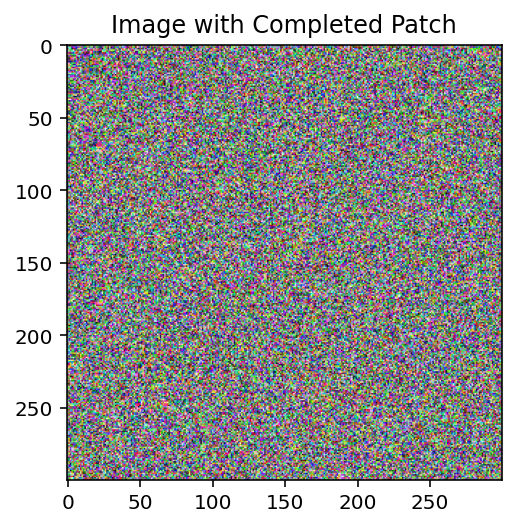

In [41]:
recon_img = als_factor_all(b1[0],b2[0],b3[0],10)
plt.imshow(F.to_pil_image(reconstructed_img))
plt.title("Image with Completed Patch")
plt.show()


Iteration 1/100, Error: 50157019.51723847
Iteration 2/100, Error: 27564515.494256392
Iteration 3/100, Error: 24808021.991927505
Iteration 4/100, Error: 23796825.77486501
Iteration 5/100, Error: 23439303.351178832
Iteration 6/100, Error: 23313692.738260902
Iteration 7/100, Error: 23262337.472617272
Iteration 8/100, Error: 23237613.601584345
Iteration 9/100, Error: 23224253.402683083
Iteration 10/100, Error: 23216503.10314111
Iteration 11/100, Error: 23211807.764768306
Iteration 12/100, Error: 23208882.84910907
Iteration 13/100, Error: 23207026.195682935
Iteration 14/100, Error: 23205831.985647056
Iteration 15/100, Error: 23205056.50640017
Iteration 16/100, Error: 23204549.365347683
Iteration 17/100, Error: 23204215.91878128
Iteration 18/100, Error: 23203995.748170137
Iteration 19/100, Error: 23203849.874406565
Iteration 20/100, Error: 23203752.950426817
Iteration 21/100, Error: 23203688.393680714
Iteration 22/100, Error: 23203645.30386517
Iteration 23/100, Error: 23203616.488265295
Iter

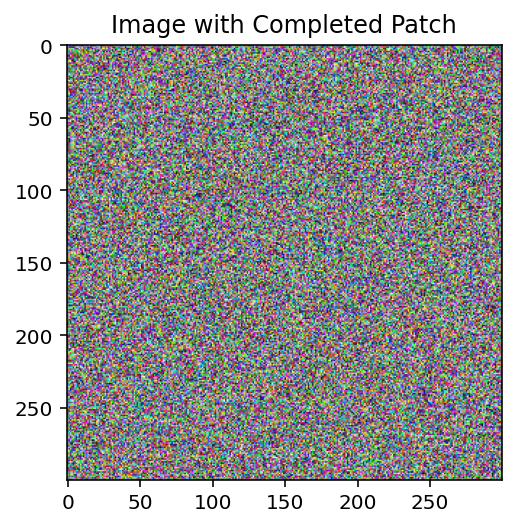

RMSE for the complete patch removal is 
78.82582053913674
PSNR for the complete patch removal is 
78.82582053913674
Iteration 1/100, Error: 46169644.40834239
Iteration 2/100, Error: 26348000.256970603
Iteration 3/100, Error: 23937399.360391725
Iteration 4/100, Error: 23354145.315911464
Iteration 5/100, Error: 23092521.31482466
Iteration 6/100, Error: 22923579.33691704
Iteration 7/100, Error: 22800695.86657918
Iteration 8/100, Error: 22710741.690619648
Iteration 9/100, Error: 22647134.943654396
Iteration 10/100, Error: 22603964.484164327
Iteration 11/100, Error: 22575634.74380932
Iteration 12/100, Error: 22557475.860781312
Iteration 13/100, Error: 22546006.270709082
Iteration 14/100, Error: 22538821.599829573
Iteration 15/100, Error: 22534339.073263466
Iteration 16/100, Error: 22531546.158077188
Iteration 17/100, Error: 22529805.55910792
Iteration 18/100, Error: 22528719.571282025
Iteration 19/100, Error: 22528040.957494985
Iteration 20/100, Error: 22527616.18043811
Iteration 21/100, Er

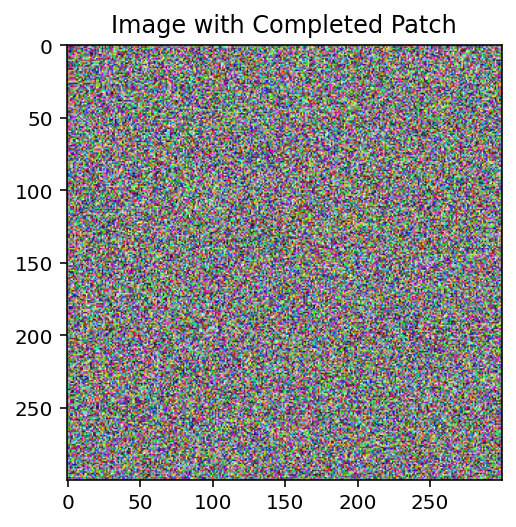

RMSE for the complete patch removal is 
78.06873292278104
PSNR for the complete patch removal is 
78.06873292278104
Iteration 1/100, Error: 44795374.18701436
Iteration 2/100, Error: 23513634.302296154
Iteration 3/100, Error: 22362059.564603344
Iteration 4/100, Error: 22116362.2043753
Iteration 5/100, Error: 22018504.416131057
Iteration 6/100, Error: 21970221.0917726
Iteration 7/100, Error: 21944844.798356403
Iteration 8/100, Error: 21931177.328744743
Iteration 9/100, Error: 21923709.437003266
Iteration 10/100, Error: 21919583.661229733
Iteration 11/100, Error: 21917282.91564811
Iteration 12/100, Error: 21915989.477238797
Iteration 13/100, Error: 21915257.17627046
Iteration 14/100, Error: 21914839.99035369
Iteration 15/100, Error: 21914601.004875112
Iteration 16/100, Error: 21914463.41210224
Iteration 17/100, Error: 21914383.823179383
Iteration 18/100, Error: 21914337.579028226
Iteration 19/100, Error: 21914310.590550423
Iteration 20/100, Error: 21914294.769494824
Iteration 21/100, Erro

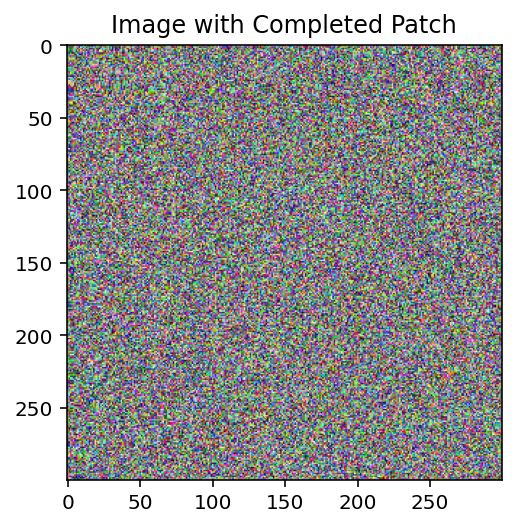

RMSE for the complete patch removal is 
76.7998141952813
PSNR for the complete patch removal is 
76.7998141952813
Iteration 1/100, Error: 47768226.14700875
Iteration 2/100, Error: 24091315.97680847
Iteration 3/100, Error: 22731830.68775915
Iteration 4/100, Error: 22478008.055968598
Iteration 5/100, Error: 22394840.281958625
Iteration 6/100, Error: 22349253.01431277
Iteration 7/100, Error: 22312642.334129237
Iteration 8/100, Error: 22277599.768619
Iteration 9/100, Error: 22241600.5898571
Iteration 10/100, Error: 22203117.702018693
Iteration 11/100, Error: 22160652.53889259
Iteration 12/100, Error: 22112651.060144875
Iteration 13/100, Error: 22057870.70858512
Iteration 14/100, Error: 21996055.097716443
Iteration 15/100, Error: 21928637.58608736
Iteration 16/100, Error: 21858964.2426636
Iteration 17/100, Error: 21791609.524025194
Iteration 18/100, Error: 21730968.023825023
Iteration 19/100, Error: 21679941.59281587
Iteration 20/100, Error: 21639451.292249173
Iteration 21/100, Error: 21608

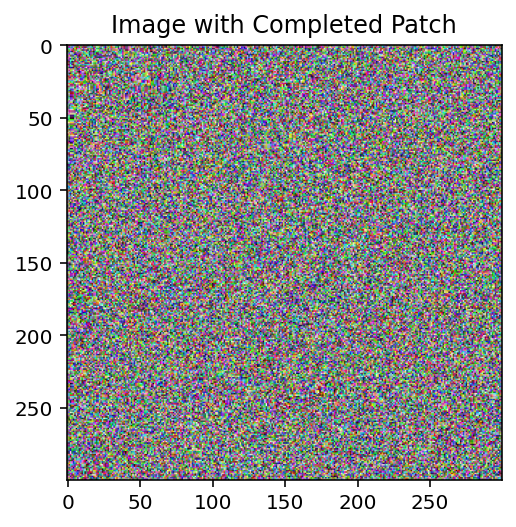

RMSE for the complete patch removal is 
75.02470120082855
PSNR for the complete patch removal is 
75.02470120082855


In [45]:
size = [20,40,60,80]
for i in size:
    modified_img = remove_rectangular_patch(crop, 0, 0, i, i)
    plt.imshow(rearrange(modified_img, 'c h w -> h w c').numpy())
    a1 = modified_img[0].float()
    a2 = modified_img[1].float()
    a3 = modified_img[2].float()
    a1_mask = mask_image(a1)
    a2_mask = mask_image(a2)
    a3_mask = mask_image(a3)
    new_img = als_factor_all(a1_mask[0],a2_mask[0],a3_mask[0],10)
    plt.imshow(F.to_pil_image(new_img))
    plt.title("Image with Completed Patch")
    plt.show()
    print("RMSE for the complete patch removal is ")
    print(calculate_rmse(modified_img,new_img))
    print("PSNR for the complete patch removal is ")
    print(calculate_rmse(modified_img,new_img))
    

Data Compression 

First Patch with one color 

In [73]:
def add_patches(base_image, patches, locations):
    """
    Add patches to a particular region of the base image.

    Parameters:
    - base_image: The base image tensor.
    - patches: List of patch tensors.
    - locations: List of tuples specifying the top-left corner coordinates of each patch.
    """
    modified_image = base_image.clone()

    for patch, (top, left) in zip(patches, locations):
        modified_image[:, top:top+patch.shape[1], left:left+patch.shape[2]] = patch

    return modified_image

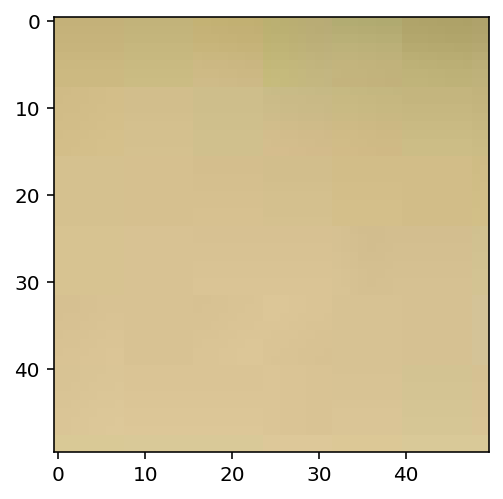

In [69]:
modified_img = torchvision.transforms.functional.crop(crop, 0, 0, 50, 50)
plt.imshow(rearrange(modified_img, 'c h w -> h w c').numpy())

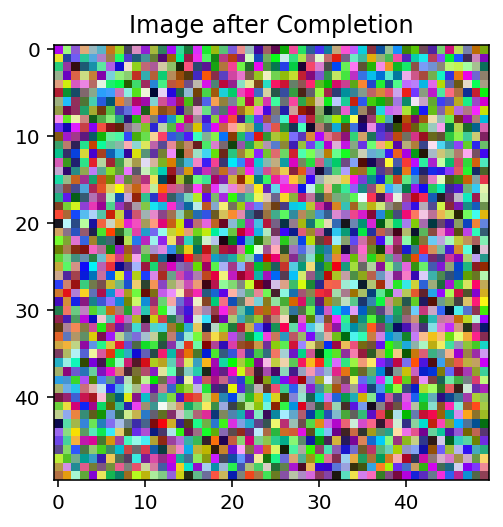

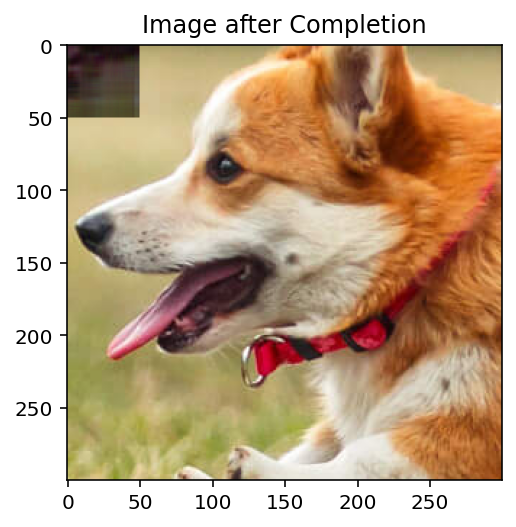

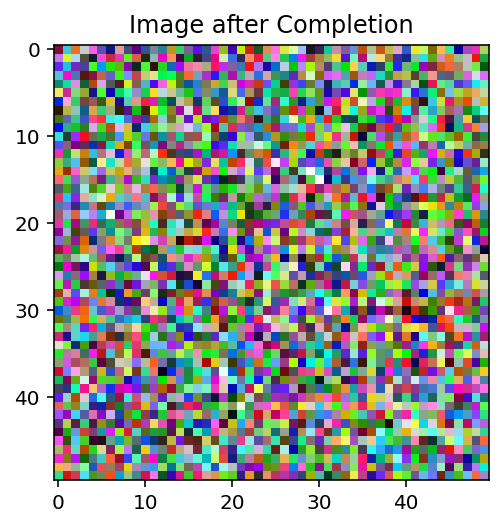

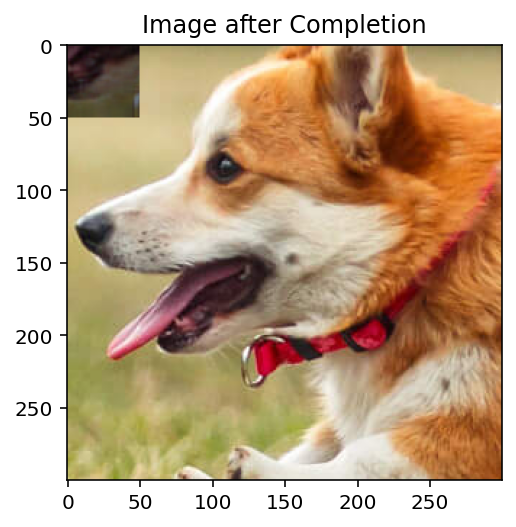

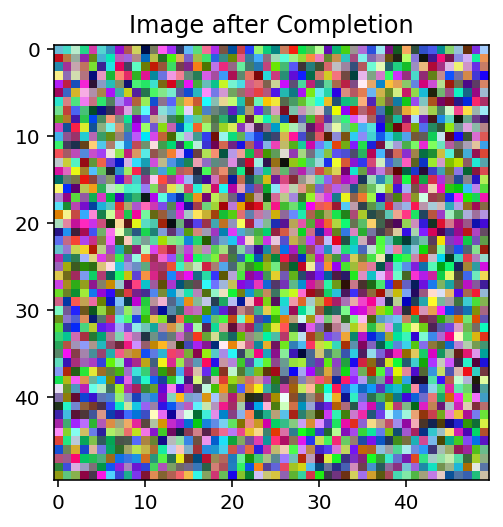

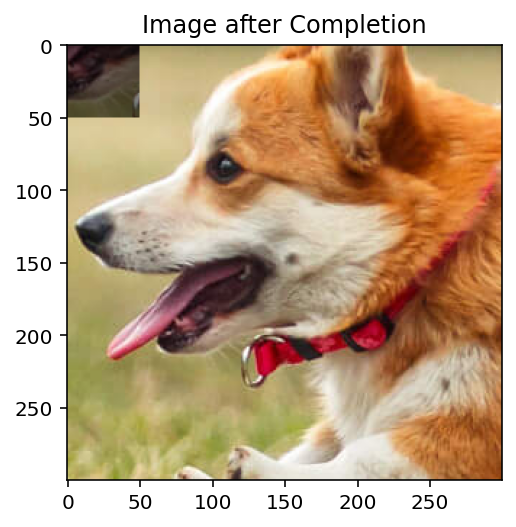

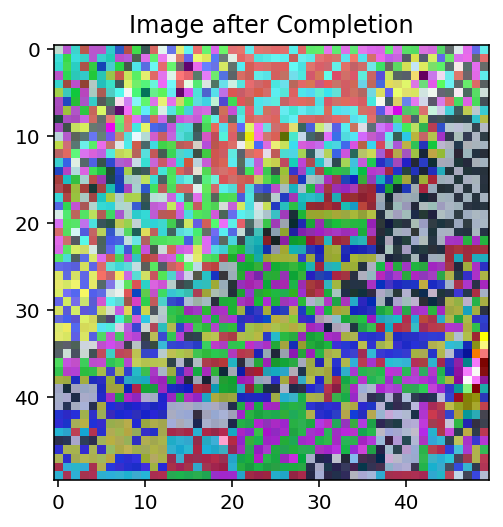

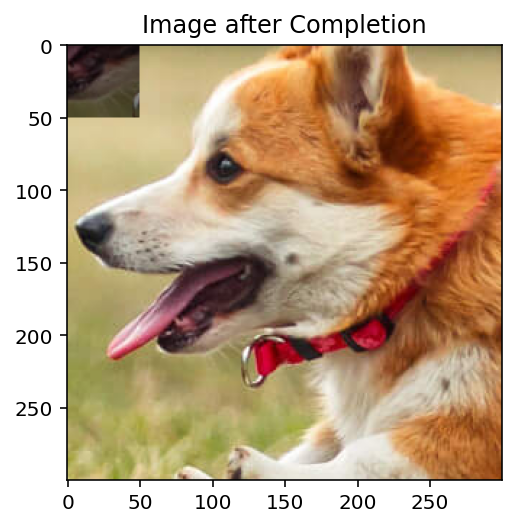

In [80]:
r = [5,10,25,50]
for i in r:
    a1 = modified_img[0].float()
    a2 = modified_img[1].float()
    a3 = modified_img[2].float()
    a1_mask = mask_image(a1)
    a2_mask = mask_image(a2)
    a3_mask = mask_image(a3)
    new_img = factorize_all(a1_mask[0],a2_mask[0],a3_mask[0],i)
    plt.imshow(F.to_pil_image(new_img))
    plt.title("Image after Completion")
    plt.show()
    modified_image = add_patches(crop, [new_img], [(0,0)])
    plt.imshow(F.to_pil_image(modified_image))
    plt.title("Image after Completion")
    plt.show()

Patch 2 with 2 colors 

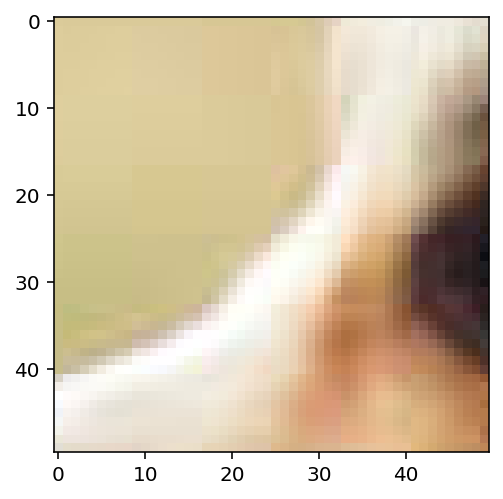

In [ ]:
modified_img = torchvision.transforms.functional.crop(crop, 55, 55, 50, 50)
plt.imshow(rearrange(modified_img, 'c h w -> h w c').numpy())

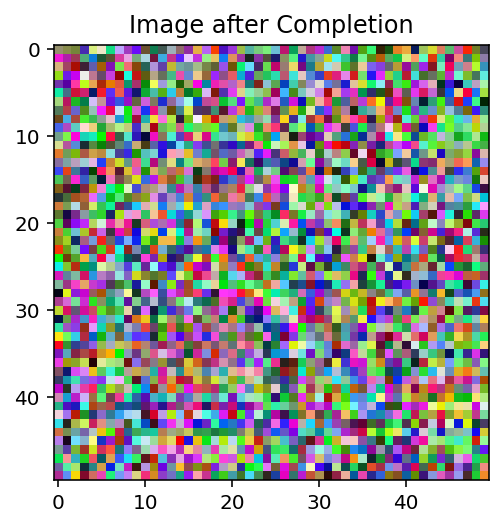

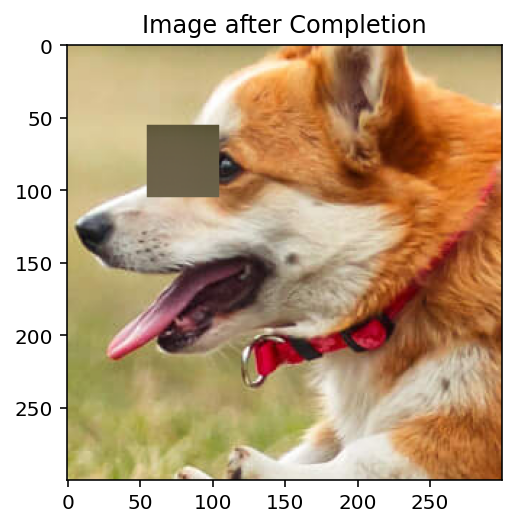

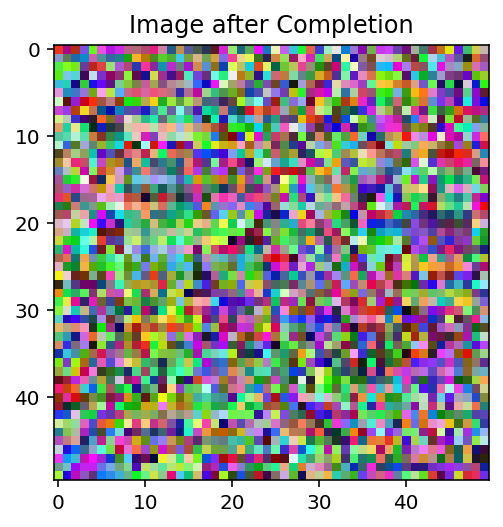

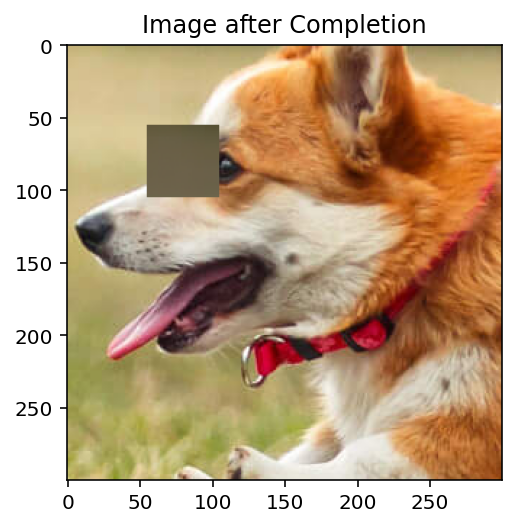

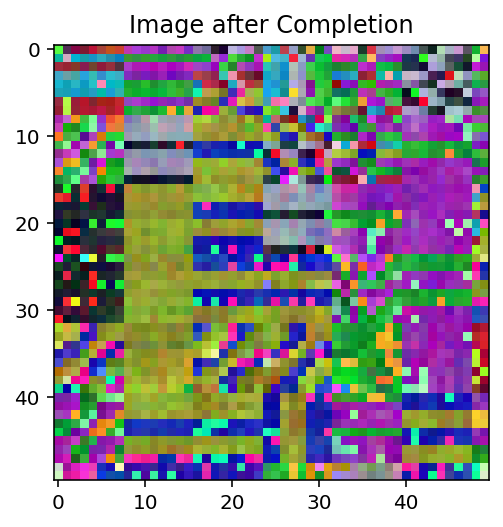

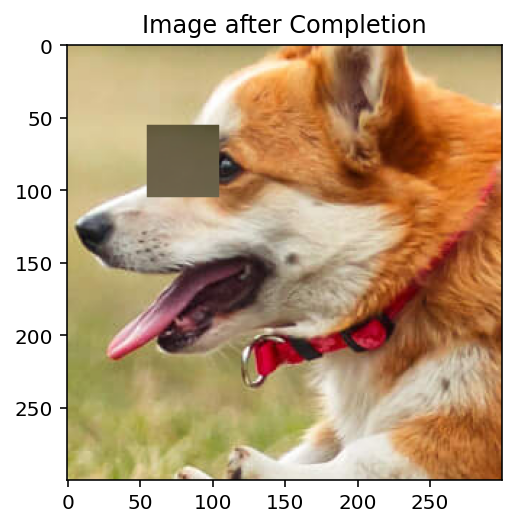

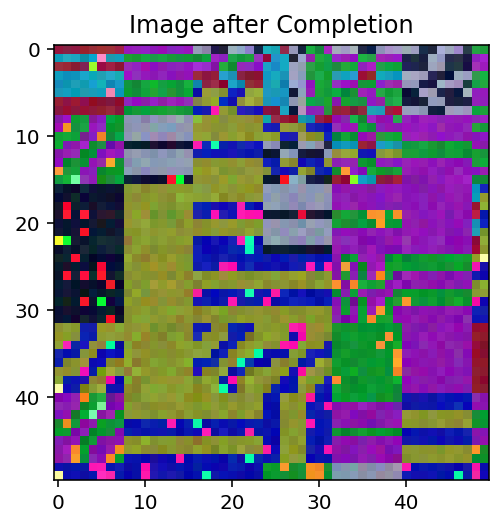

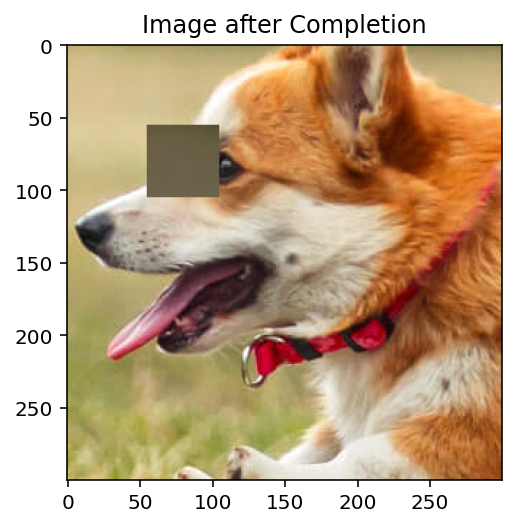

In [77]:
r = [5,10,25,50]
for i in r:
    a1 = modified_img[0].float()
    a2 = modified_img[1].float()
    a3 = modified_img[2].float()
    a1_mask = mask_image(a1)
    a2_mask = mask_image(a2)
    a3_mask = mask_image(a3)
    new_img = factorize_all(a1_mask[0],a2_mask[0],a3_mask[0],i)
    plt.imshow(F.to_pil_image(new_img))
    plt.title("Image after Completion")
    plt.show()
    modified_image = add_patches(crop, [new_img], [(55,55)])
    plt.imshow(F.to_pil_image(modified_image))
    plt.title("Image after Completion")
    plt.show()

Patch with 5 colors 

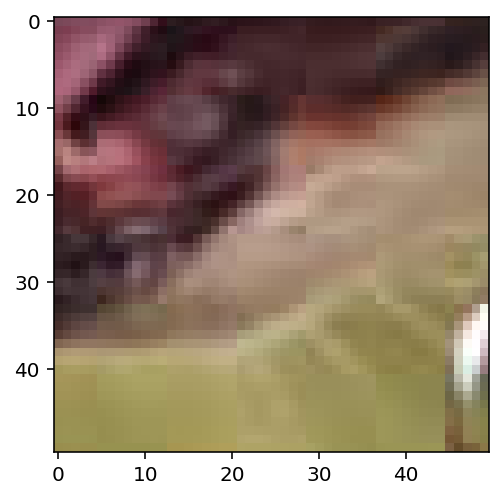

In [78]:
modified_img = torchvision.transforms.functional.crop(crop, 175, 75, 50, 50)
plt.imshow(rearrange(modified_img, 'c h w -> h w c').numpy())

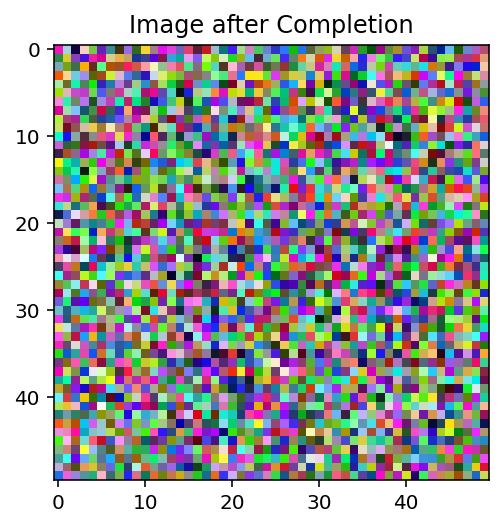

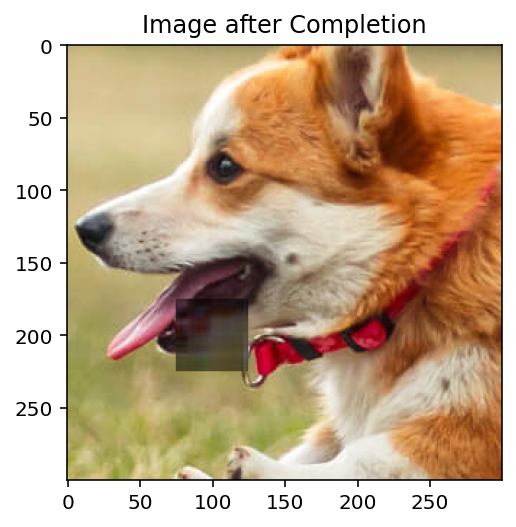

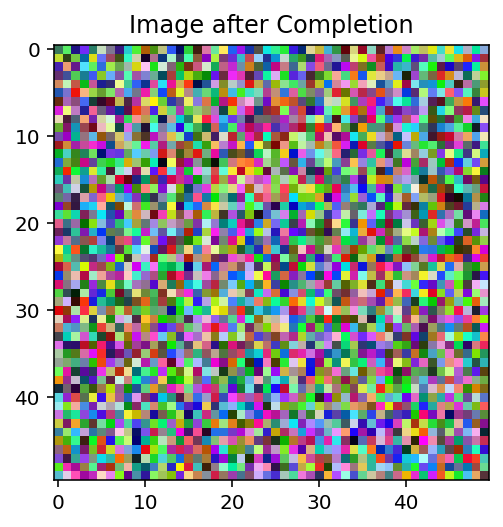

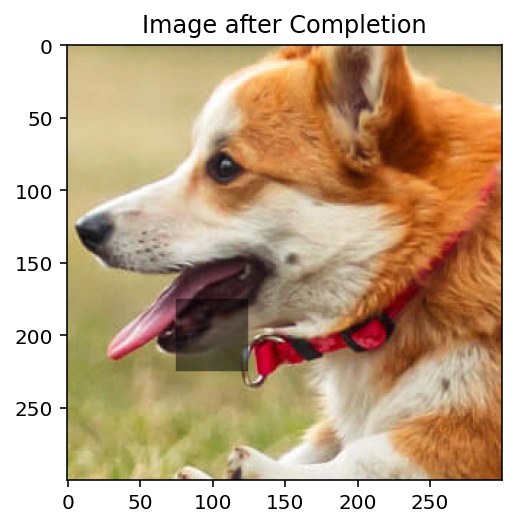

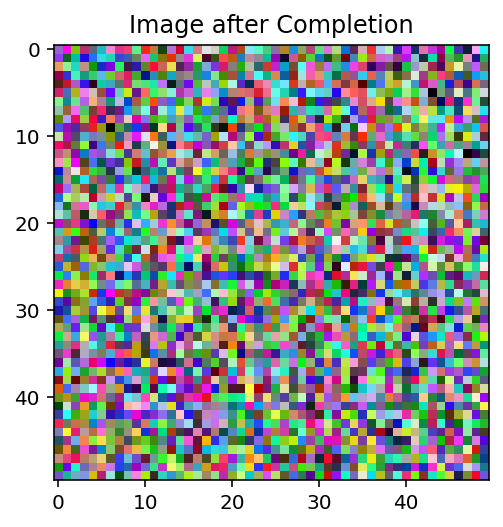

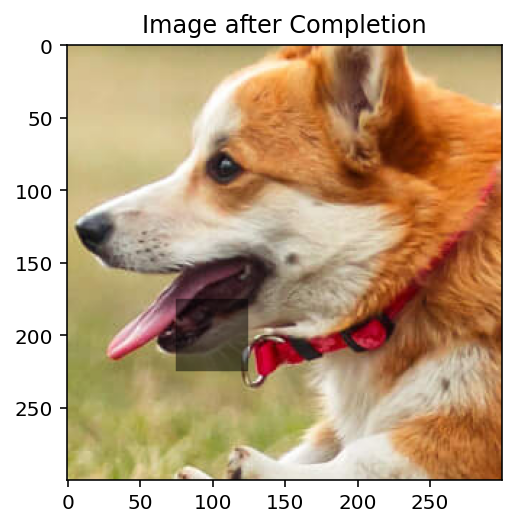

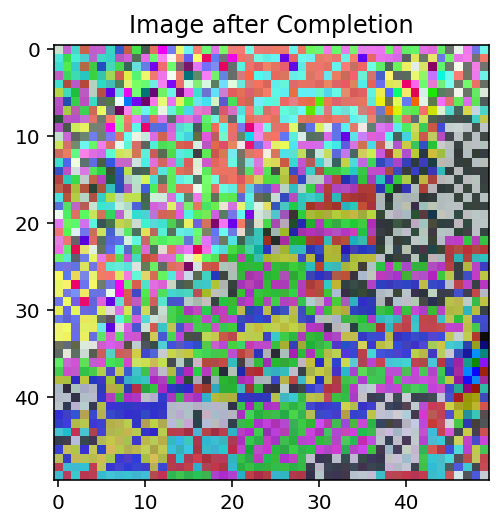

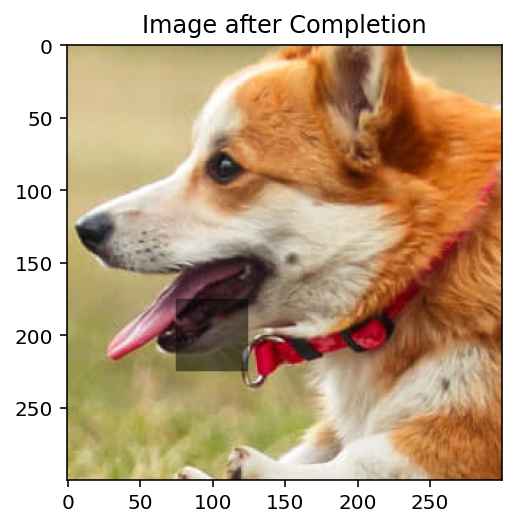

In [79]:
r = [5,10,25,50]
for i in r:
    a1 = modified_img[0].float()
    a2 = modified_img[1].float()
    a3 = modified_img[2].float()
    a1_mask = mask_image(a1)
    a2_mask = mask_image(a2)
    a3_mask = mask_image(a3)
    new_img = factorize_all(a1_mask[0],a2_mask[0],a3_mask[0],i)
    plt.imshow(F.to_pil_image(new_img))
    plt.title("Image after Completion")
    plt.show()
    modified_image = add_patches(crop, [new_img], [(175,75)])
    plt.imshow(F.to_pil_image(modified_image))
    plt.title("Image after Completion")
    plt.show()